# Mask R-CNN - Inspect DIC Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [162]:
import cv2
import os
from os.path import join
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

from samples.dic import dic

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = r"G:\DataForDL\logs\mrcnn\choosed\dic20200210T1204"

# Path to DIC trained weights
# You can download this file from the Releases page
# https://github.com/matterport/Mask_RCNN/releases
DIC_WEIGHTS_PATH = join(MODEL_DIR, "mask_rcnn_dic_0020.h5")  # TODO: update this path
DIC_DIR = os.path.join(ROOT_DIR, "datasets/dic_sample")

## Configurations

In [163]:
config = dic.DicConfig()
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
# config.display()

## Notebook Preferences

In [164]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [165]:
def get_ax(rows=1, cols=1, size=10):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Load Validation Dataset

In [232]:
# Load validation dataset
dataset = dic.DicDataset()
dataset.load_dic(DIC_DIR, "train")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 60
Classes: ['BG', 'dic']


## Load Model

In [167]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

In [168]:
model.load_weights(DIC_WEIGHTS_PATH, by_name=True)







Re-starting from epoch 20


# Get mask with Grabcut

In [267]:
from scipy.ndimage import gaussian_filter
from skimage import data
from skimage import img_as_float
from skimage.morphology import reconstruction

In [263]:
def dilate_image(image, size=4):
    image = img_as_float(image)
    image = gaussian_filter(image, 4)

    seed = np.copy(image)
    seed[1:-1, 1:-1] = np.min(image)
    mask = image

    dilated = reconstruction(seed, mask, method='dilation')
    return dilated

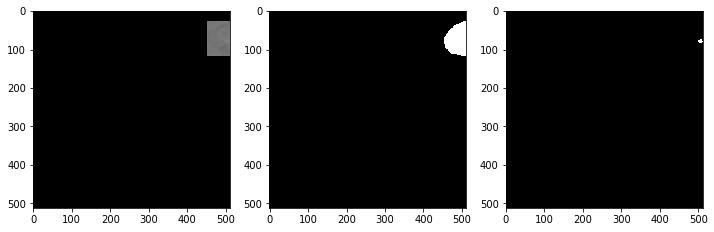

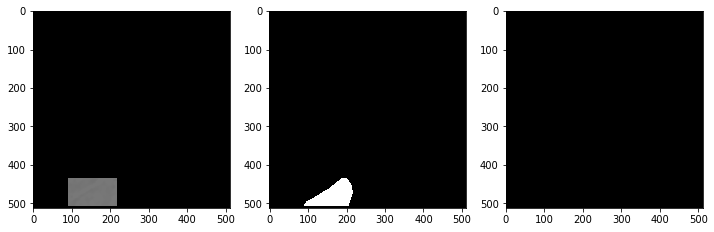

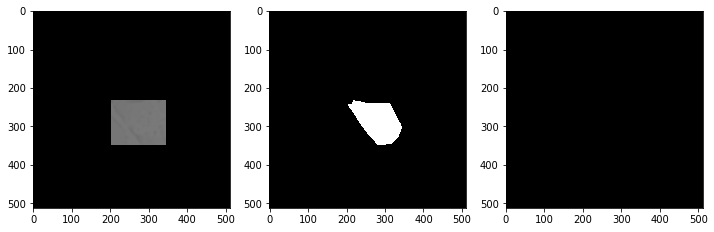

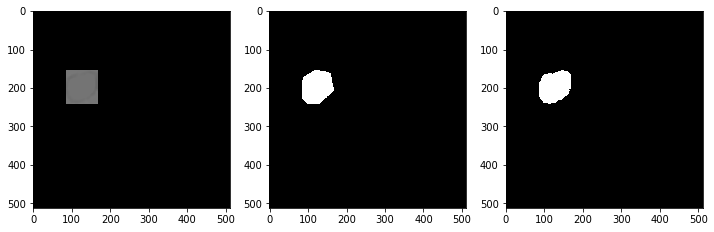

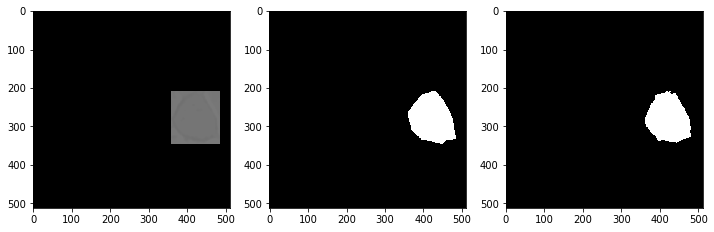

...

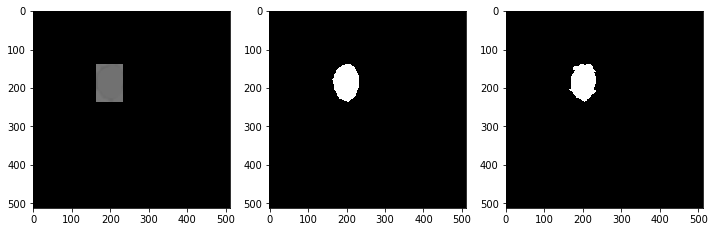

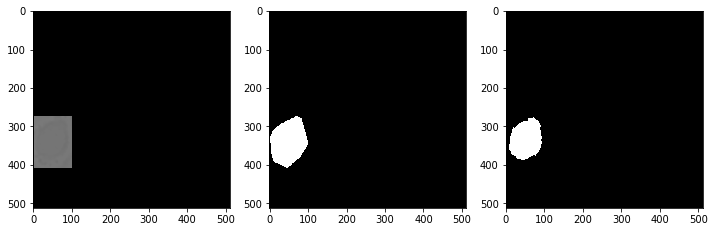

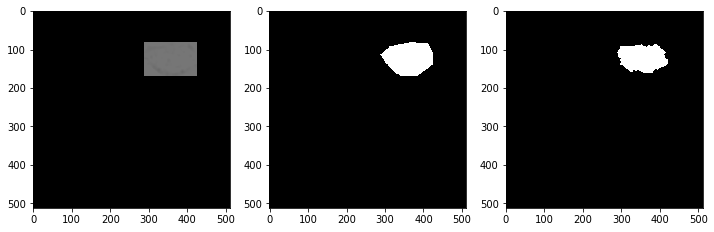

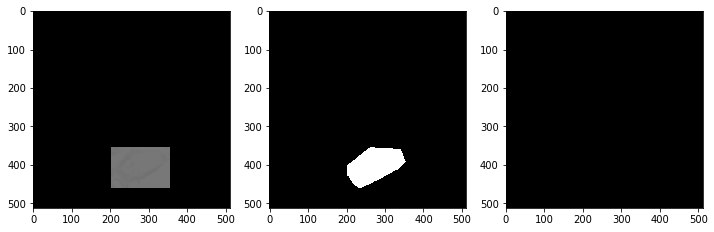

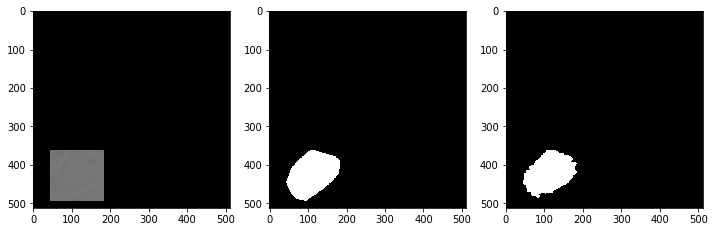

In [265]:
# Check Grabout output
image_id = 2
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)

dilated = dilate_image(image)
inputs = skimage.img_as_ubyte(dilated)
# inputs = scipy.ndimage.median_filter(image[:,:,0], (20, 20))
# inputs = cv2.cvtColor(inputs, cv2.COLOR_GRAY2BGR)
masks = []
for bid in range(gt_bbox.shape[0]):
    rect0 = (gt_bbox[bid][1], gt_bbox[bid][0], gt_bbox[bid][3]-gt_bbox[bid][1], gt_bbox[bid][2]-gt_bbox[bid][0])   # (x,y,w,h)
    mask = np.zeros(image.shape[:2],np.uint8)
    bgdModel = np.zeros((1,65), np.float64)
    fgdModel = np.zeros((1,65), np.float64)
    cv2.grabCut(inputs,mask,rect0,bgdModel,fgdModel,10,cv2.GC_INIT_WITH_RECT)
    mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')

    _, axes = plt.subplots(1,3, figsize=(12,6))
    mask0 = np.zeros(image.shape[:2])
    mask0[rect0[1]:rect0[1]+rect0[3], rect0[0]:rect0[0]+rect0[2]] = 1
    shit = (mask0[:,:,np.newaxis]*inputs).astype(np.uint8)
    axes[0].imshow(shit)
    axes[1].imshow(gt_mask[:,:,bid], cmap='gray')
    axes[2].imshow(mask2, cmap="gray")
    plt.show()

In [272]:
np.unique(img)

array([  0,   3,   4,   7,   8,  12,  13,  16,  17,  27,  28,  31,  32,
        35,  36,  38,  42,  43,  46,  47,  50,  51,  54,  55,  58,  59,
        62,  63,  65,  67,  73,  74,  75,  76,  79,  80,  82,  84,  85,
        88,  89,  92,  95, 102, 103, 109, 112, 113, 115, 116, 117, 120,
       121, 123, 125, 128, 130, 136, 137, 144, 145, 146, 147, 149, 150,
       151, 154, 155, 157, 159, 162, 163, 166, 167, 168, 171, 174, 175,
       179, 181, 182, 188, 189, 202, 203, 205, 206, 212, 213, 215, 217,
       218, 222, 225, 231, 232, 234, 235, 243, 244, 250, 251, 256, 257,
       260, 261, 264, 265, 268, 271, 272, 276, 278, 279, 285, 286, 290,
       291, 293, 295, 297, 299, 305, 306, 308, 309, 315, 316, 319, 320,
       326, 327, 329, 330, 336, 337, 339, 340, 341, 344, 345, 346, 349,
       350, 352, 354, 357, 358, 361, 362, 365, 368, 369, 372, 373, 376,
       377, 379, 381, 383, 385, 388, 392, 394, 397, 398, 401, 402, 405,
       406, 408, 411, 412, 415, 416, 417, 420, 421, 424, 425, 43

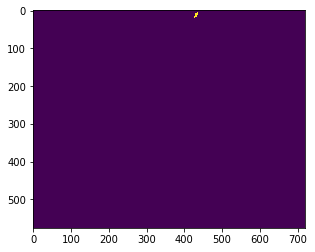

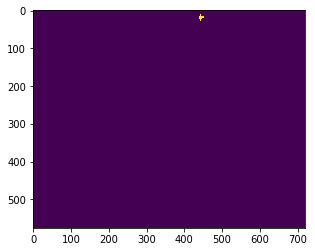

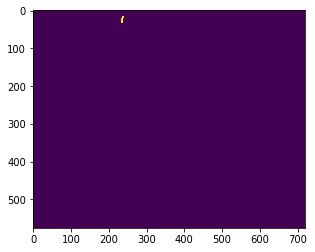

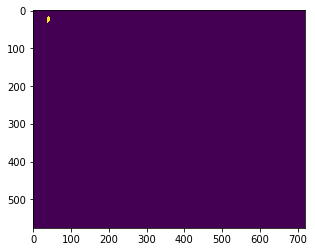

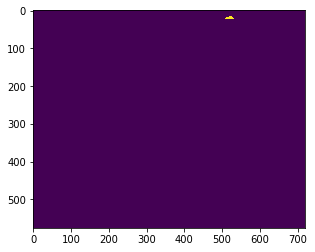

...

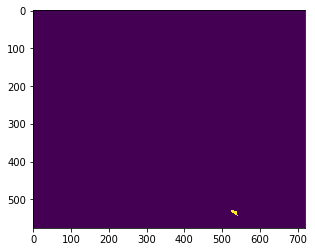

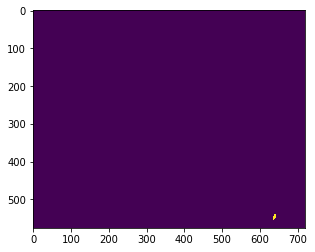

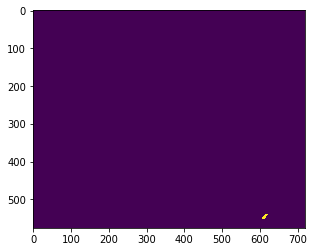

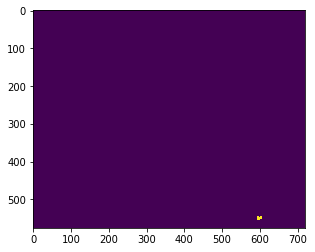

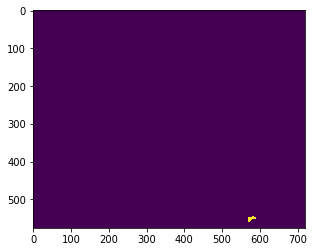

In [276]:
img_label = skimage.measure.label(img)
for i in np.arange(1, img_label.max()+1, 1):
    mg = np.where(img_label==i, 1, 0)
    plt.imshow(mg)
    plt.show()

In [277]:
img.dtype

dtype('uint16')

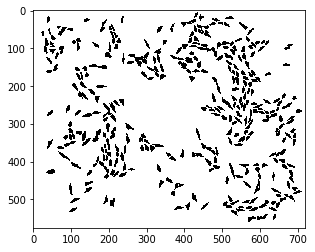

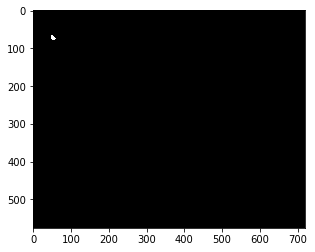

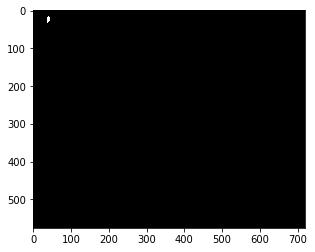

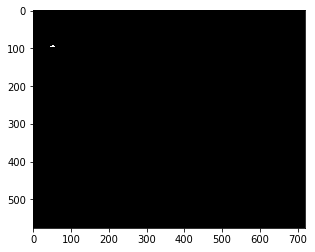

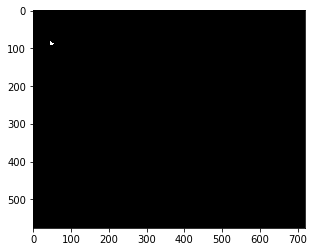

...

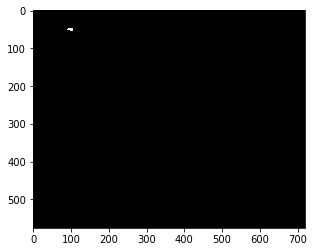

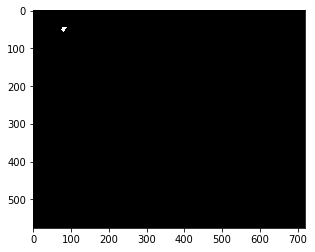

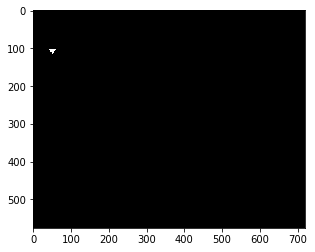

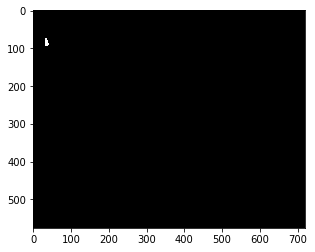

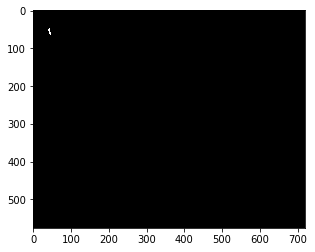

In [271]:
for i in np.unique(img):
    plt.imshow(np.where(img==i, 1, 0), cmap='gray')
    plt.show()
    if i > 30:
        break

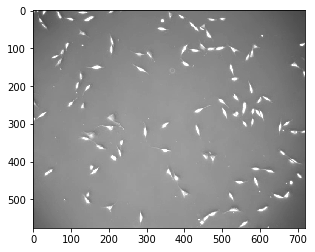

In [278]:
from skimage import io
path = r'G:\DataForDL\data\cell_tracking_cha\export\PhC-C2DL-PSC\01\t072.tif'
img = io.imread(path)
plt.imshow(img, cmap='gray')

In [281]:
dataset.image_info[image_id]['path']

'C:\\Users\\Administrator\\Desktop\\exp\\code\\Mask_RCNN-master\\datasets/dic_sample\\train\\t031.png'

## Run Detection

image ID: dic.t001.png (0) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t001.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   37.00000  max:  250.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   37.00000  max:  250.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


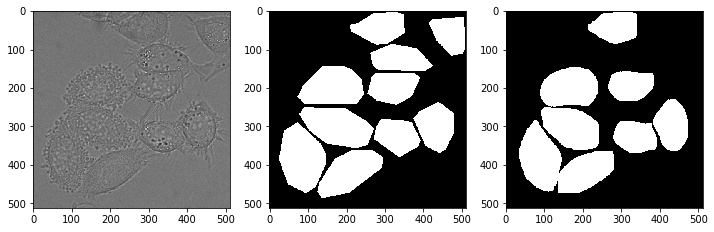

image ID: dic.t014.png (1) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t014.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   32.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   32.00000  max:  255.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


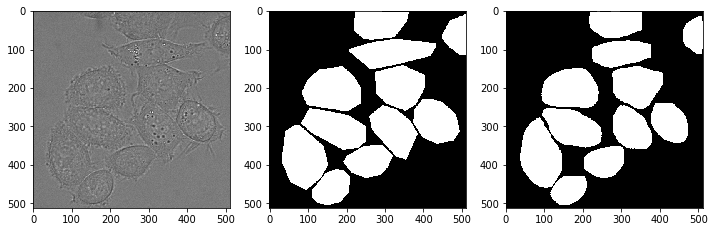

image ID: dic.t029.png (2) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t029.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   36.00000  max:  237.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   36.00000  max:  237.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


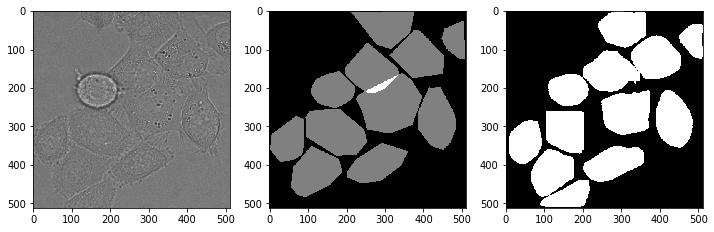

image ID: dic.t046.png (3) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t046.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   36.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   36.00000  max:  255.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


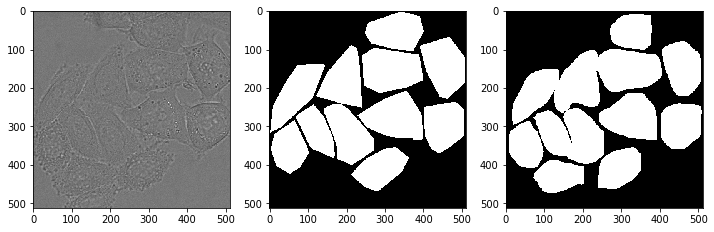

image ID: dic.t069.png (4) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t069.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   33.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   33.00000  max:  255.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


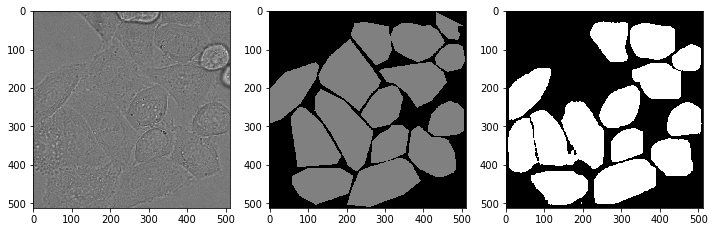

image ID: dic.t086.png (5) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t086.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   32.00000  max:  248.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   32.00000  max:  248.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


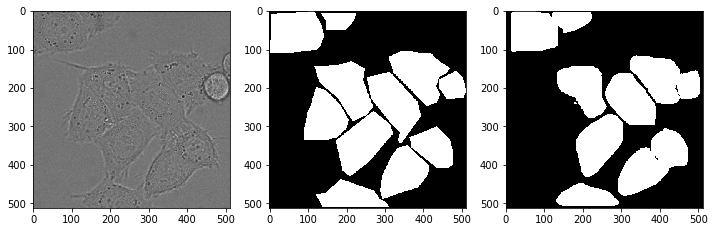

image ID: dic.t104.png (6) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t104.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   35.00000  max:  233.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   35.00000  max:  233.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


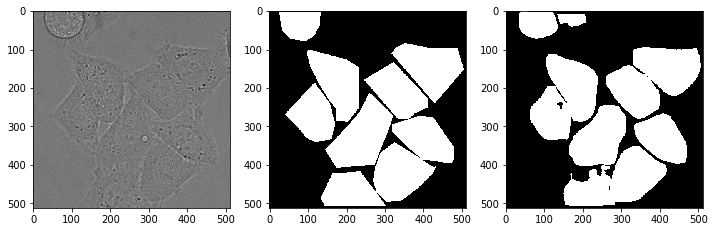

image ID: dic.t118.png (7) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t118.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   34.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   34.00000  max:  255.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


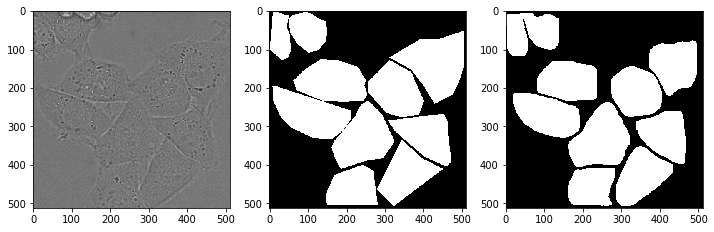

image ID: dic.t136.png (8) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t136.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   34.00000  max:  241.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   34.00000  max:  241.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


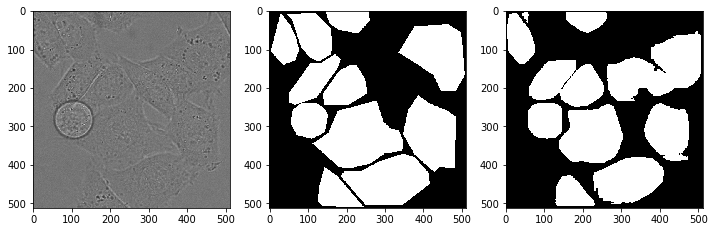

image ID: dic.t154.png (9) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t154.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   33.00000  max:  231.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:   33.00000  max:  231.00000  uint8
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


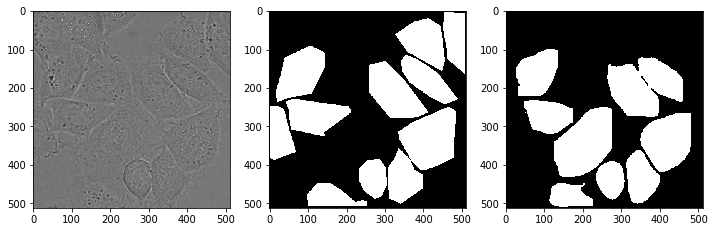

In [15]:
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                           dataset.image_reference(image_id)))
    results = model.detect_molded(np.expand_dims(image, 0), np.expand_dims(image_meta, 0), verbose=1)
    r = results[0]
    _, ax = plt.subplots(1,3,figsize=(12,6))
    ax[0].imshow(image, cmap='gray')
    ax[1].imshow(gt_mask.sum(axis=-1), cmap='gray')
    ax[2].imshow(np.where(r['masks'].sum(axis=-1)==0,0,1), cmap='gray')
    plt.show()

image ID: dic.t001.png (0) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t001.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   37.00000  max:  250.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -86.70000  max:  146.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


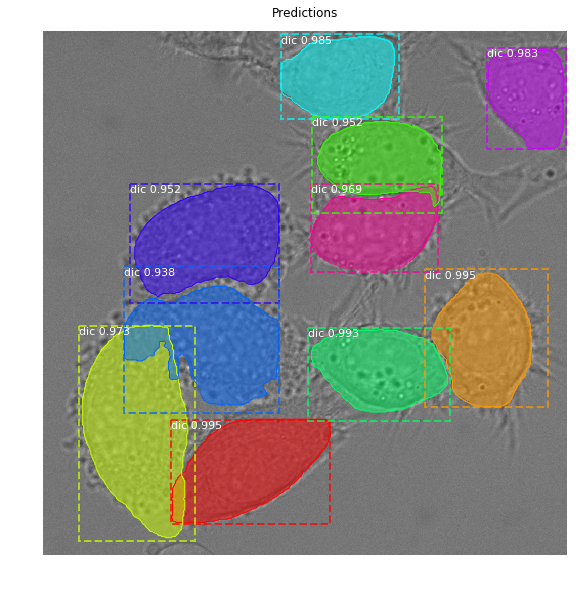

image ID: dic.t014.png (1) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t014.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   32.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -91.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


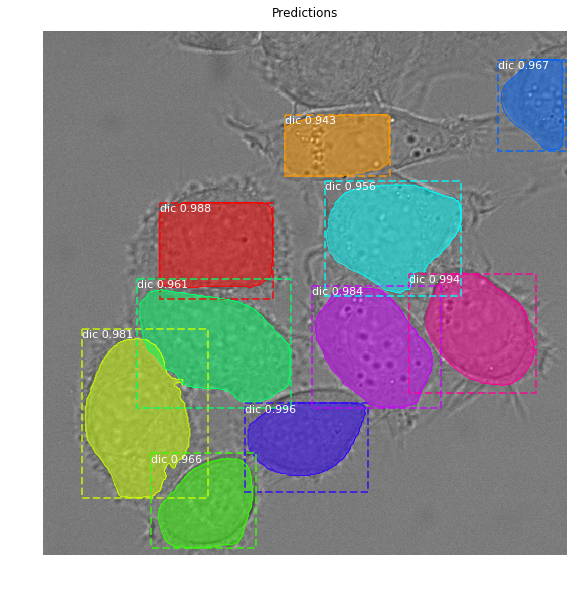

image ID: dic.t029.png (2) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t029.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   36.00000  max:  237.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -87.70000  max:  133.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


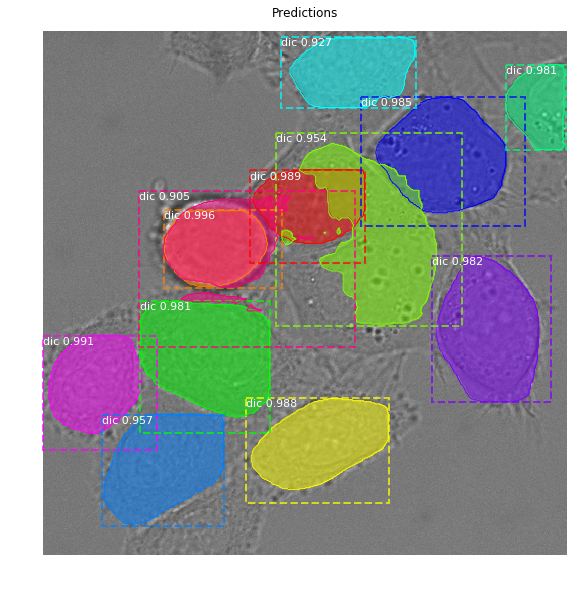

image ID: dic.t046.png (3) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t046.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   36.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -87.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


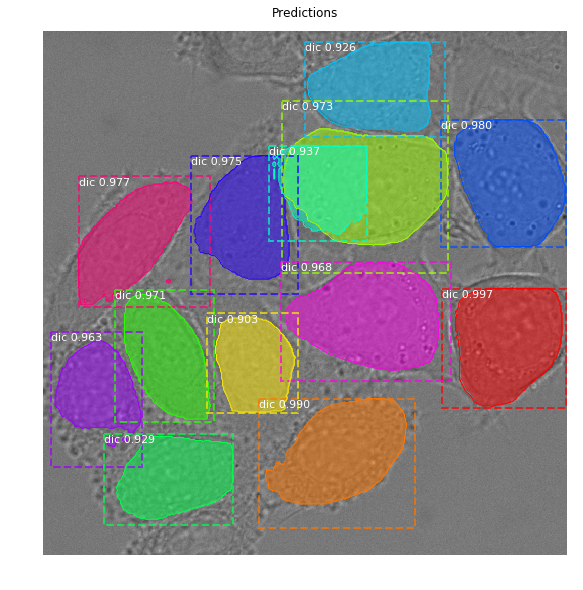

image ID: dic.t069.png (4) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t069.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   33.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -90.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


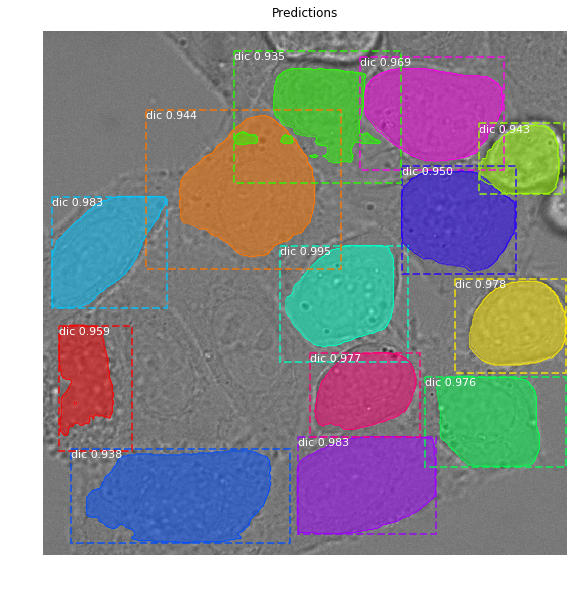

image ID: dic.t086.png (5) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t086.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   32.00000  max:  248.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -91.70000  max:  144.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


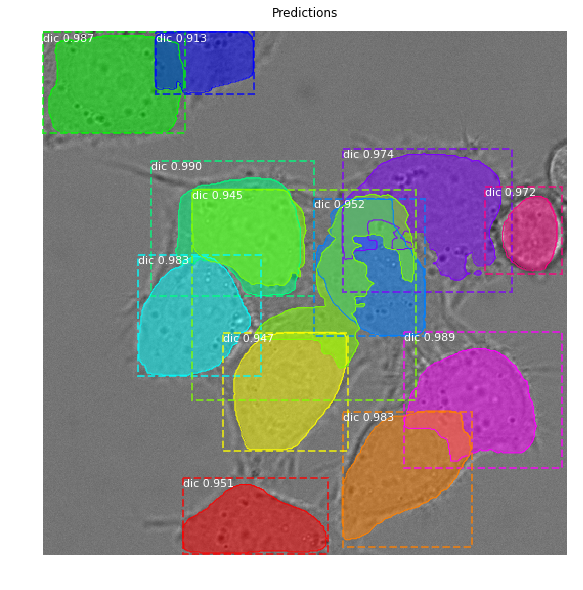

image ID: dic.t104.png (6) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t104.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   35.00000  max:  233.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -88.70000  max:  129.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


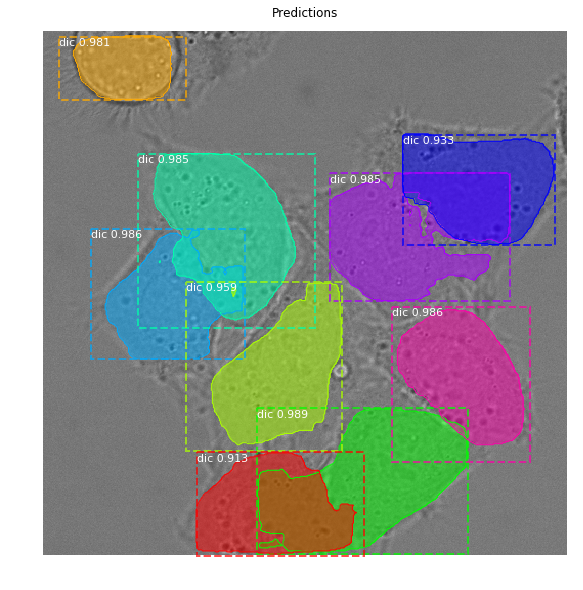

image ID: dic.t118.png (7) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t118.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   34.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -89.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


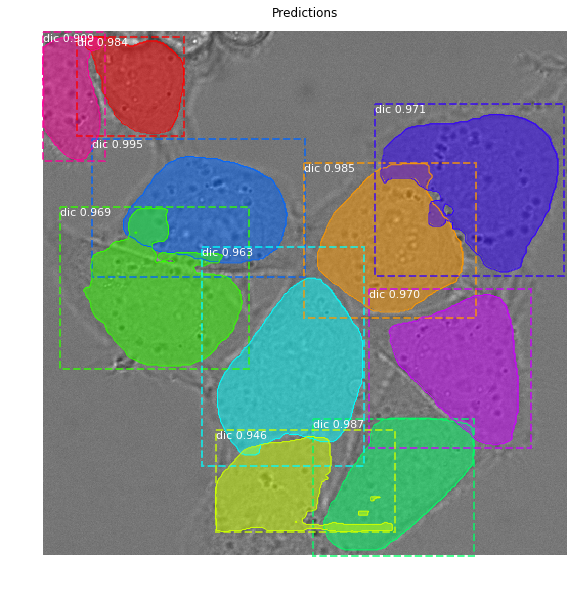

image ID: dic.t136.png (8) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t136.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   34.00000  max:  241.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -89.70000  max:  137.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


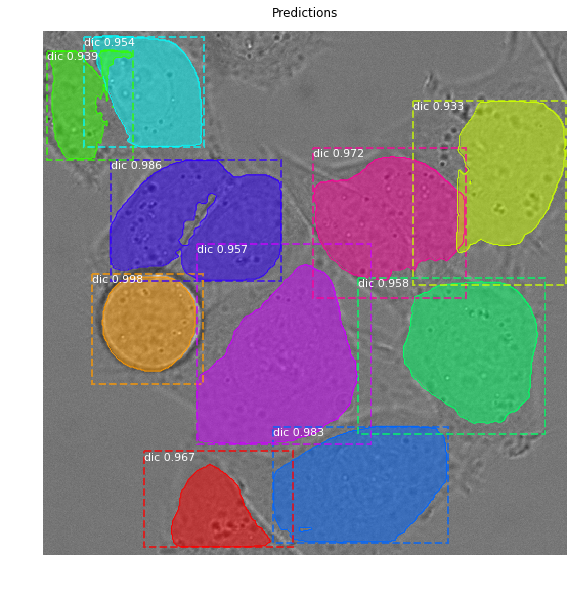

image ID: dic.t154.png (9) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t154.png
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:   33.00000  max:  231.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -90.70000  max:  127.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


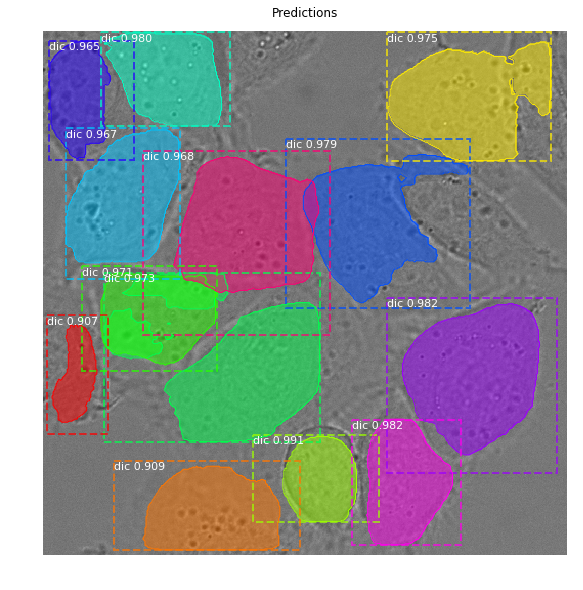

In [32]:
# show results
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                           dataset.image_reference(image_id)))
    print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

    # Run object detection
    results = model.detect([image], verbose=1)

    # Display results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], figsize=(10,10),
                                show_bbox=True, show_mask=True,
                                title="Predictions")

In [8]:
def compute_mask_iou(gt_mask, pred_mask):
    intersect = np.sum(gt_mask*pred_mask)
    union = gt_mask.sum()+pred_mask.sum()-intersect
    return intersect*1./union

In [9]:
iou, APs = [], []
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    # print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, dataset.image_reference(image_id)))


    # Run object detection
    results = model.detect([image], verbose=1)
    r = results[0]
    
    union_mask_label = np.where(gt_mask.sum(axis=-1)==0, 0, 1)
    union_mask_pred = np.where(r['masks'].sum(axis=-1)==0, 0, 1)
    iou.append(compute_mask_iou(union_mask_label, union_mask_pred))
    
    ap = utils.compute_ap_range(
            gt_bbox, gt_class_id, gt_mask,
            r['rois'], r['class_ids'], r['scores'], r['masks'],
            verbose=0)
    APs.append(ap)
    print(iou[-1], APs[-1])

Processing 1 images
image                    shape: (512, 512, 3)         min:   37.00000  max:  250.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -86.70000  max:  146.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
0.8582812275406065 0.7354285712114403
Processing 1 images
image                    shape: (512, 512, 3)         min:   32.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -91.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
0.8727585787084543 0.7790043313588415
Processing 1 images
image                    shape: (512, 512, 3)         min:   36.00000  max:  237.00000  uint8
molded

In [10]:
np.mean(iou), np.mean(APs)

(0.7891820383488894, 0.6670126050546755)

image ID: dic.t001.png (0) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t001.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   37.00000  max:  250.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -86.70000  max:  146.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
image ID: dic.t014.png (1) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t014.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   32.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -91.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -

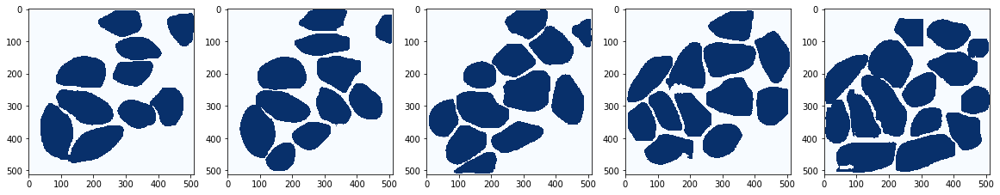

image ID: dic.t104.png (6) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t104.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   35.00000  max:  233.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -88.70000  max:  129.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
image ID: dic.t118.png (7) C:\Users\Administrator\Desktop\exp\code\Mask_RCNN-master\datasets/dic_sample\val\t118.png
Processing 1 images
image                    shape: (512, 512, 3)         min:   34.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min:  -89.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -

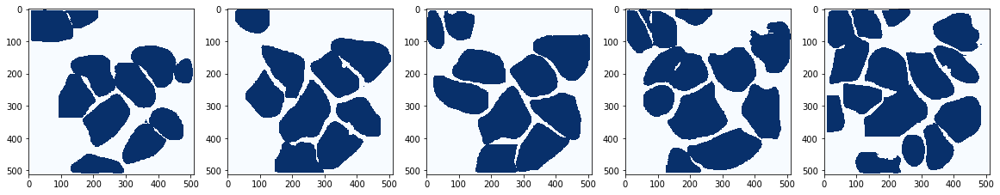

In [15]:
for image_id in dataset.image_ids:
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
    info = dataset.image_info[image_id]
    print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                           dataset.image_reference(image_id)))

    # Run object detection
    results = model.detect([image], verbose=1)

    # Display results
    if image_id % 5==0:
        if image_id!=0:
            plt.show()
        fig, axes = plt.subplots(1,5,figsize=(20,6))
    r = results[0]
    axes[image_id%5].imshow(np.where(r['masks'].sum(axis=-1)==0, 0, 1), cmap='Blues')

## Color Splash

This is for illustration. You can call `balloon.py` with the `splash` option to get better images without the black padding.

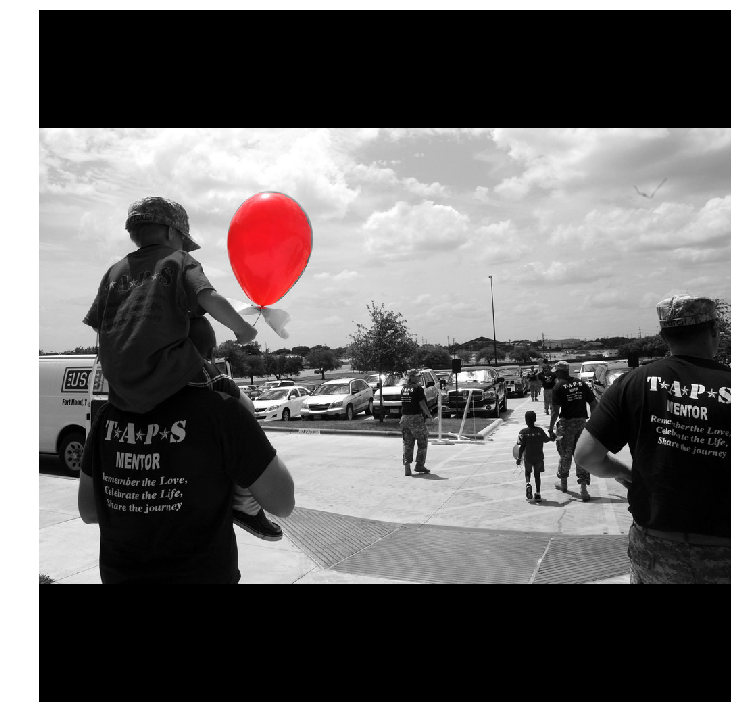

In [11]:
splash = balloon.color_splash(image, r['masks'])
display_images([splash], cols=1)

## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [12]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -7.54862  max:    3.09359  float64
positive_anchors         shape: (41, 4)               min:  272.00000  max:  778.62742  float64
negative_anchors         shape: (215, 4)              min:  -64.00000  max: 1141.01934  float64
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (41, 4)               min:  267.00000  max:  747.00000  float32


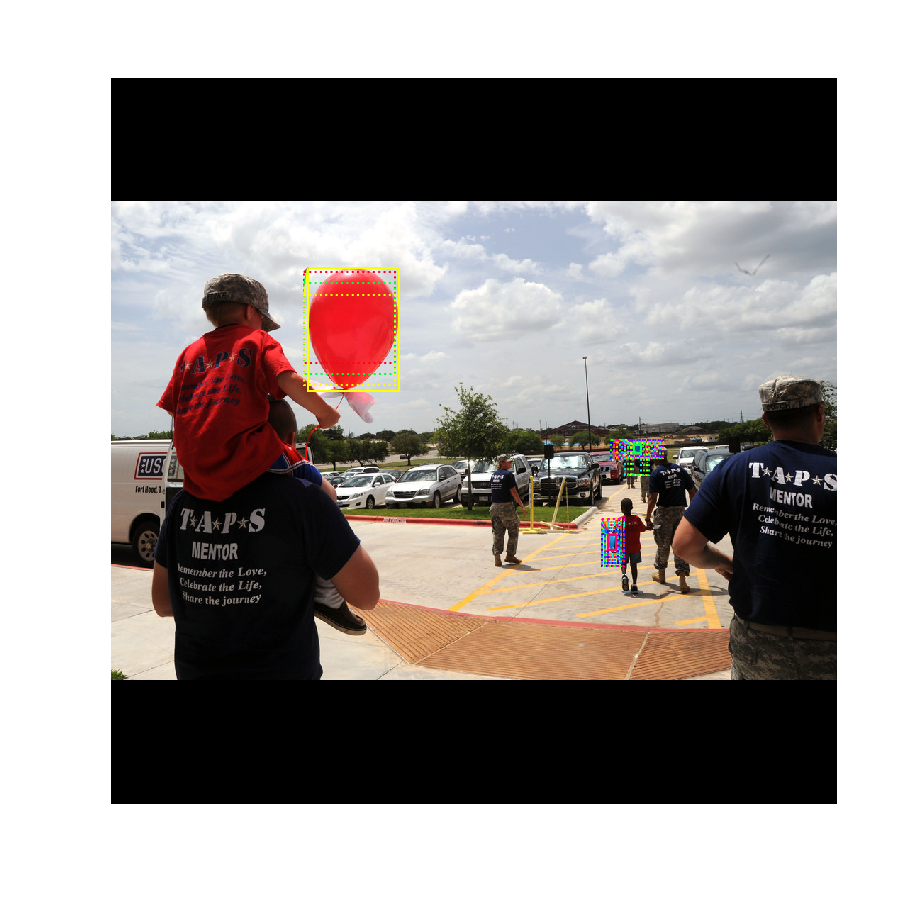

In [13]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [14]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.35390  max:    1.29134  float32
refined_anchors          shape: (1, 6000, 4)          min:   -1.41072  max:    2.26672  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (1000,)               min:    0.00000  max: 4530.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


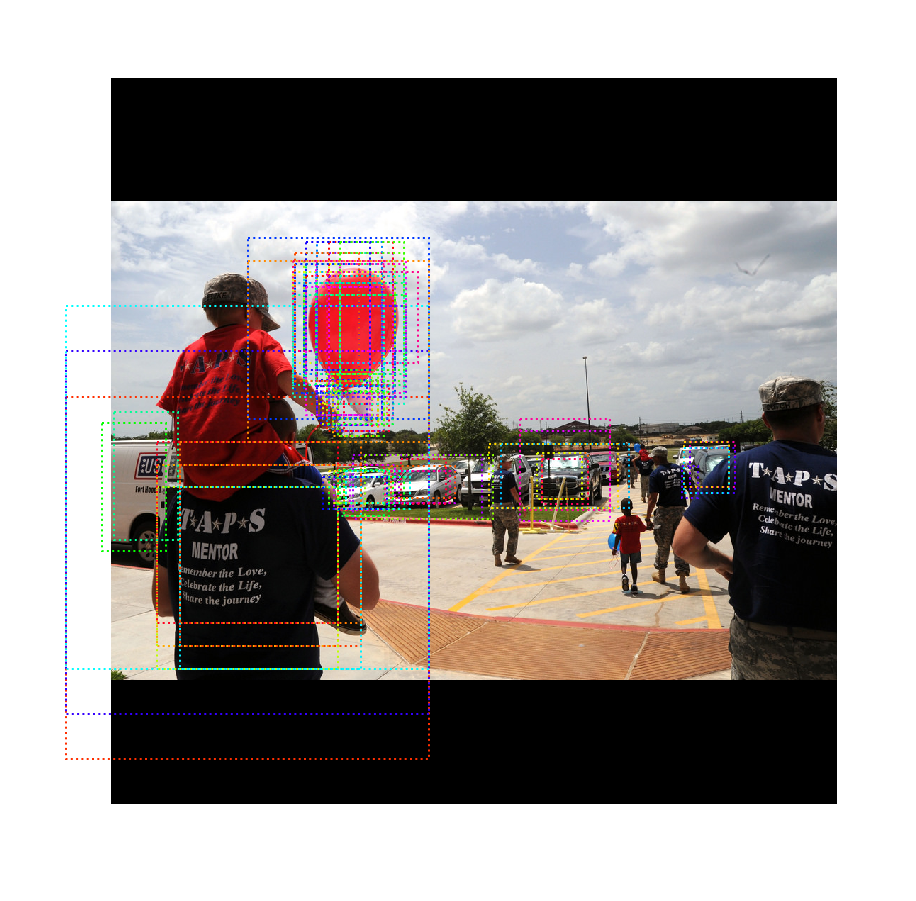

In [15]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

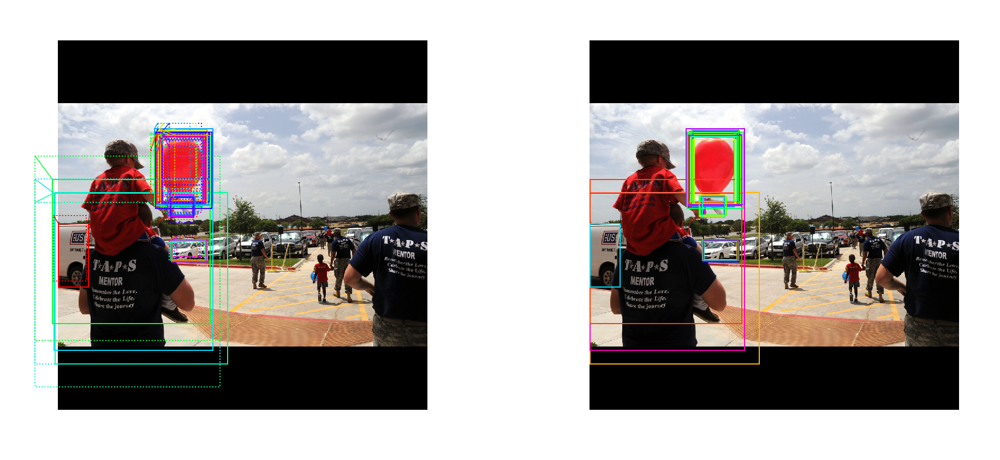

In [16]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

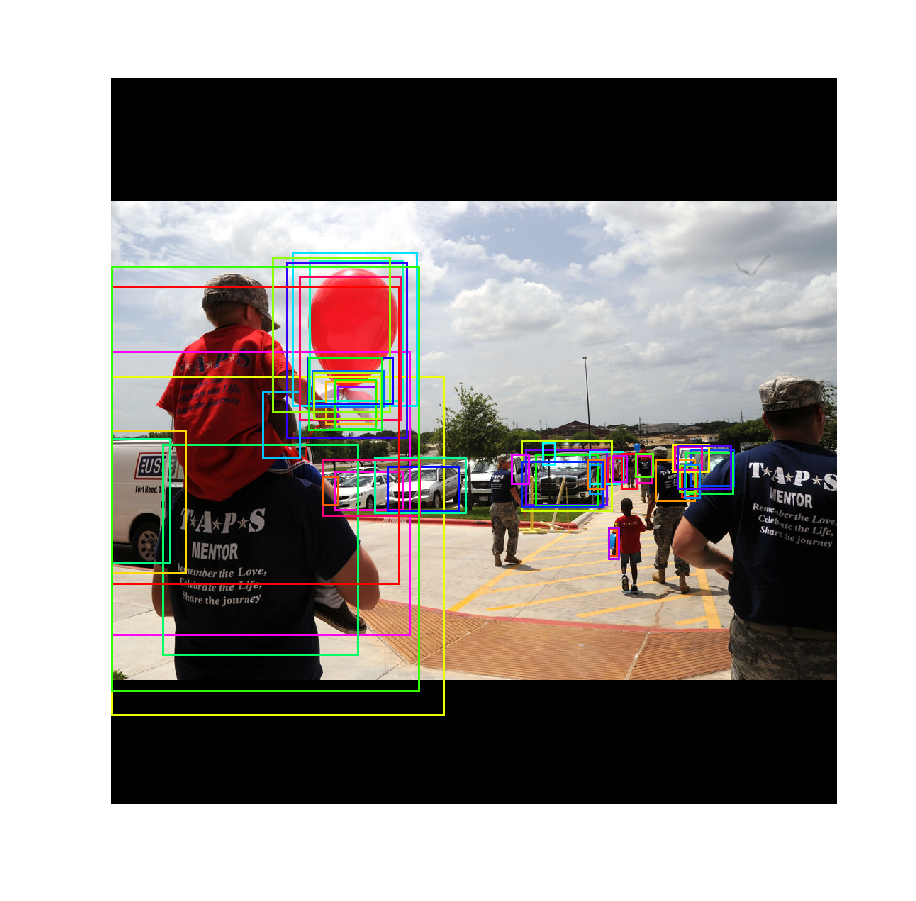

In [17]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

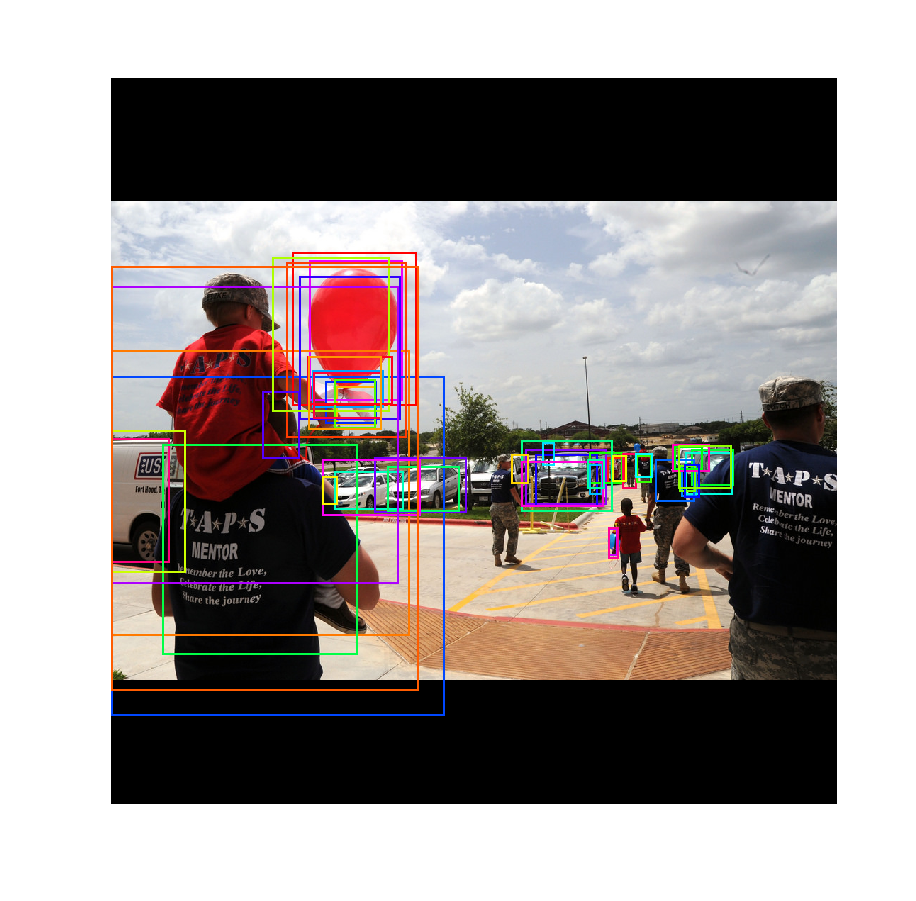

In [18]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [60]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 2)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 2, 4)       min:   -5.11945  max:    4.23470  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    1.00000  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32


1 detections: ['balloon']


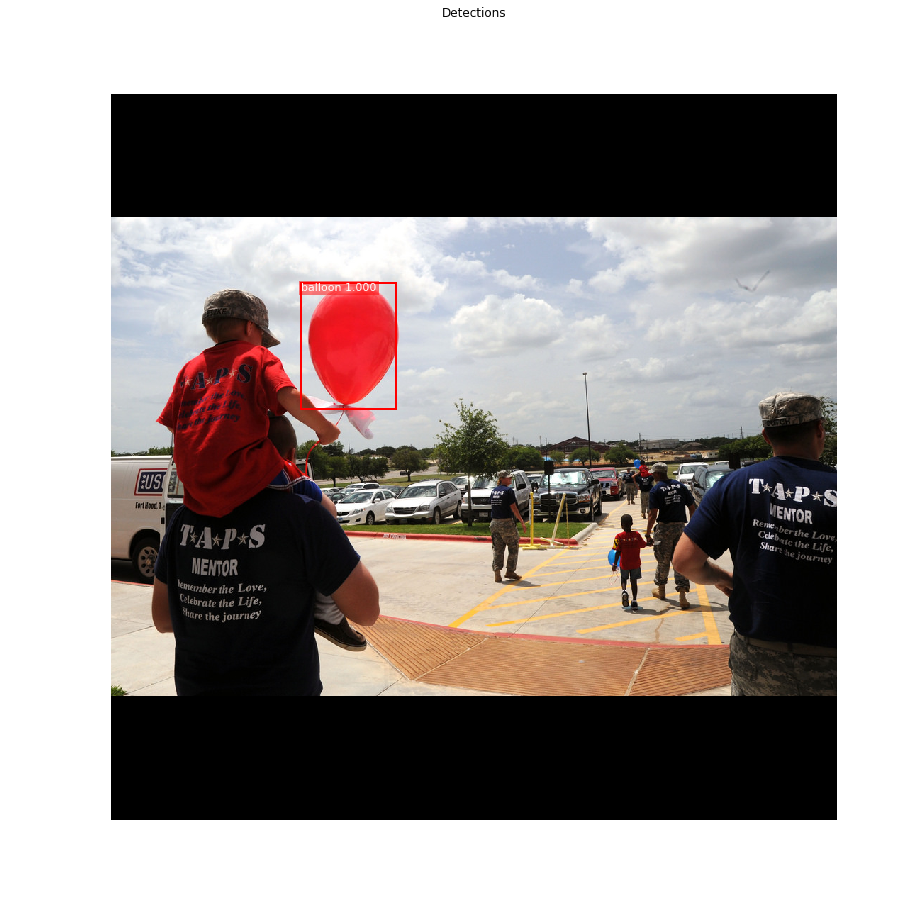

In [61]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [62]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1000 Valid proposals out of 1000
11 Positive ROIs
[('BG', 989), ('balloon', 11)]


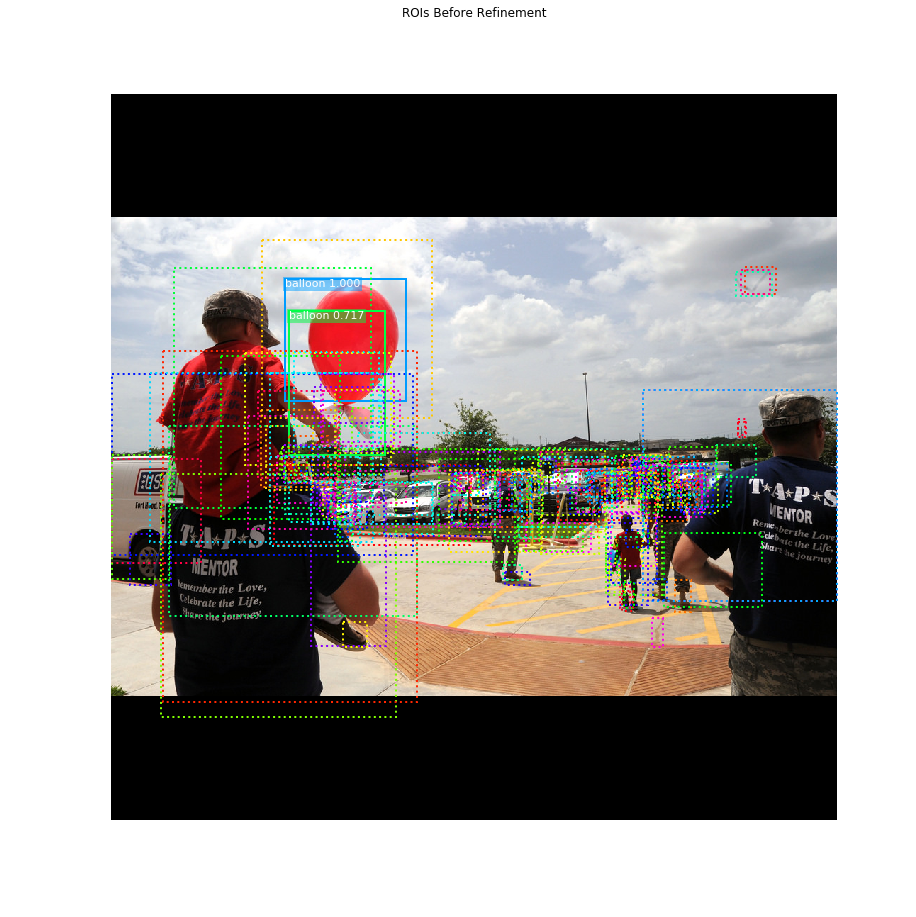

In [63]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -5.11945  max:    4.23470  float32
refined_proposals        shape: (1000, 4)             min: -352.00000  max: 1427.00000  int32


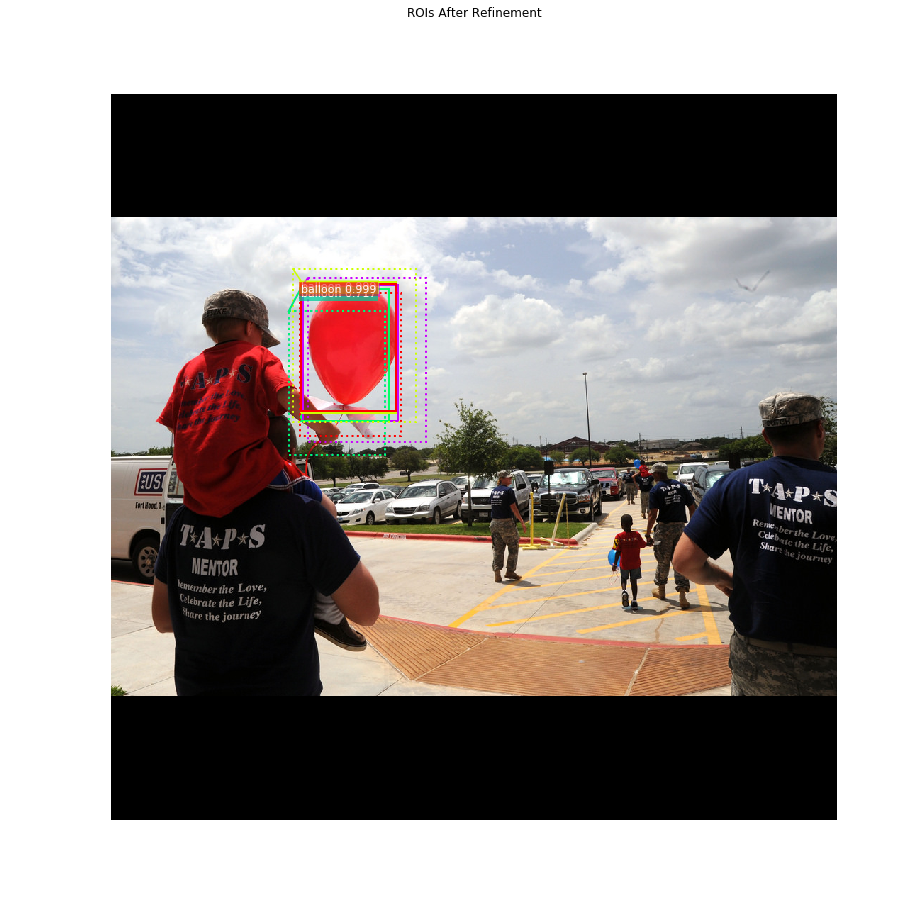

In [67]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_bbox_specific.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [24]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 11 detections:
[  1  13  15  18  28 113 171 290 535 543 926]


In [25]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.9 confidence. Keep 9:
[  1  13  15  18  28 113 290 535 543]


#### Per-Class Non-Max Suppression

In [26]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

balloon               : [  1  13  15  18  28 113 290 535 543] -> [113]

Kept after per-class NMS: 1
[113]


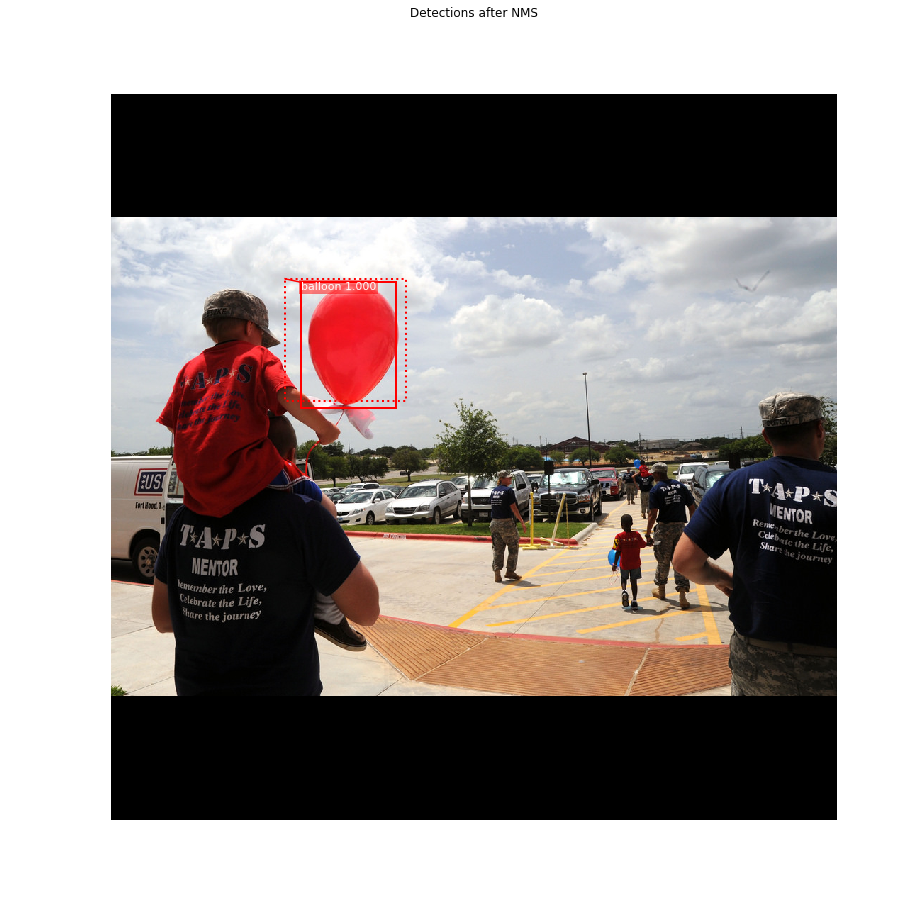

In [27]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

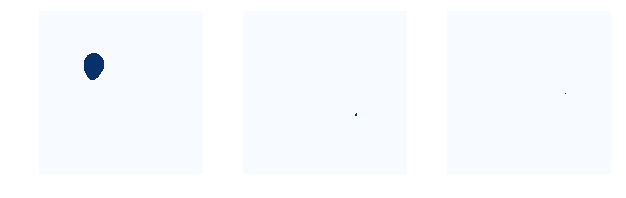

In [28]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")    # 3 instances

### 3.b Predicted Masks

In [84]:
mrcnn['detections'][0, :, 5]

array([0.9998466, 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
       0.       , 0.       , 0.       , 0.       , 

In [77]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)  # detection 6个维度，前四个维度是box的coord，后两个分别代表预测结果和预测分数，cao，且很多padding的0
det_count = np.where(det_class_ids == 0)[0][0]        # 因为，fg的结果排在前面，bg的结果在后，即是一个1，0分别连续的序列，取0所在的最小序号，即前面所有1的个数。       
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 100, 28, 28, 2)   min:    0.00000  max:    1.00000  float32
1 detections: ['balloon']


In [30]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])           # 一样的，1是连续的(才能枚举i)，det_class_ids与各个1对应的(取mask channel： c)
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (1, 28, 28)           min:    0.00000  max:    1.00000  float32
det_masks                shape: (1, 1024, 1024)       min:    0.00000  max:    1.00000  bool


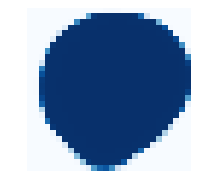

In [31]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

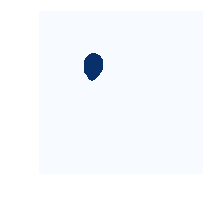

In [32]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [220]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("res5c_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 512, 512, 3)      min:  -86.70000  max:  146.10001  float32
res2c_out                shape: (1, 128, 128, 256)    min:    0.00000  max:   11.95651  float32
res3c_out                shape: (1, 64, 64, 512)      min:    0.00000  max:   14.23492  float32
res5c_out                shape: (1, 32, 32, 1024)     min:    0.00000  max:   32.31301  float32
rpn_bbox                 shape: (1, 65472, 4)         min:   -8.13917  max:   10.56637  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


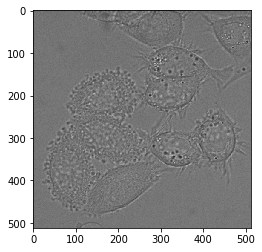

In [170]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

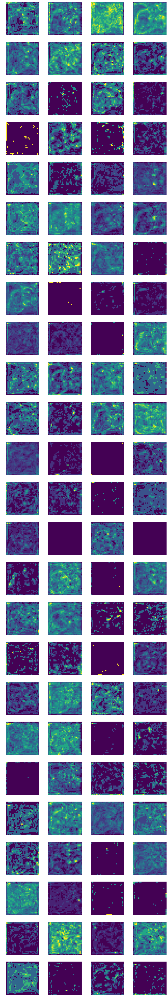

In [222]:
# Backbone feature map
display_images(np.transpose(activations["res5c_out"][0,:,:,:100], [2, 0, 1]), cols=4)    # set channel idx